# GradCam
## https://keras.io/examples/vision/grad_cam/

In [1]:
import cv2
import os
import numpy as np

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model

# Display
from IPython.display import Image, display
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import warnings
warnings.filterwarnings('ignore')

In [2]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [3]:
from tensorflow.keras.models import load_model
model = load_model('./model_save/class6_03_tf2_mymodel_Adam_val_loss_best.hdf5')

In [4]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 16)      2320      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 56, 56, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 56, 56, 32)        4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 28, 28, 32)        9

In [5]:
last_conv_layer_name = 'max_pooling2d_4'

In [6]:
img_size = (224, 224)
preprocess_input = keras.applications.resnet50.preprocess_input
decode_predictions = keras.applications.resnet50.decode_predictions

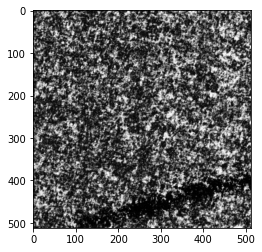

In [7]:
# The local path to our target image
img_path = './DAGM_KaggleUpload/Class6/Train/0606.PNG'
cvimg = cv2.imread(img_path)
img = cv2.cvtColor(cvimg,cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [8]:
# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)

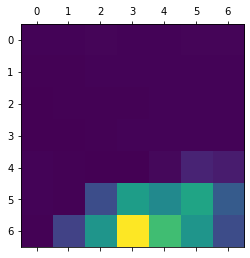

In [9]:
# # Print what the top predicted class is
# preds = model.predict(img_array)
# print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

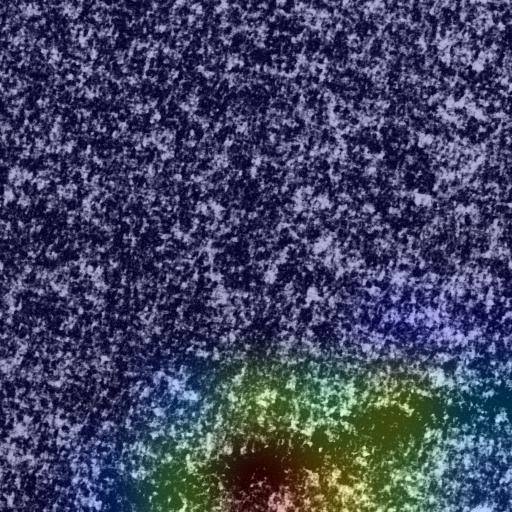

In [10]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

## 訓練集結果

In [11]:
import pandas as pd

In [12]:
df = pd.read_table('./DAGM_KaggleUpload/Class6/Train/Label/Labels.txt',sep='\t',header=0, names=['NG','img_name','0','NG_label','NaN'])
df = df[['NG', 'img_name']]
df_NG = df[df['NG'] == 1]

In [13]:
df_NG

,NG,img_name
579,1,0579.PNG
581,1,0581.PNG
587,1,0587.PNG
598,1,0598.PNG
599,1,0599.PNG
...,...,...
1112,1,1112.PNG
1115,1,1115.PNG
1124,1,1124.PNG
1130,1,1130.PNG


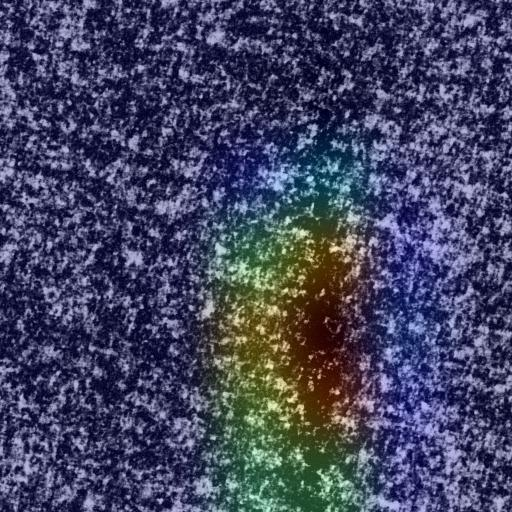

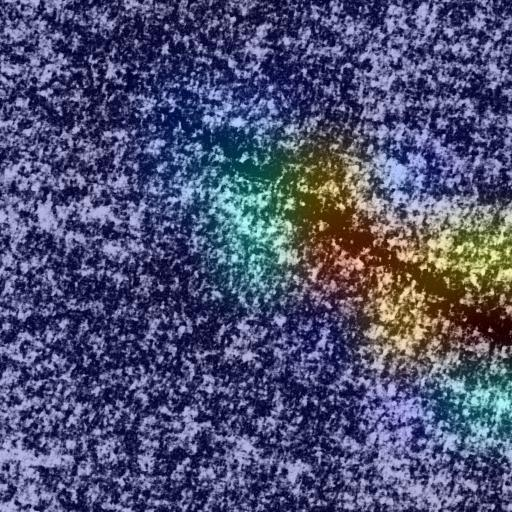

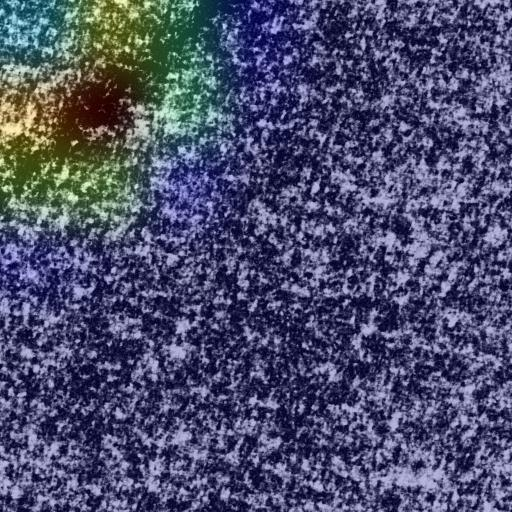

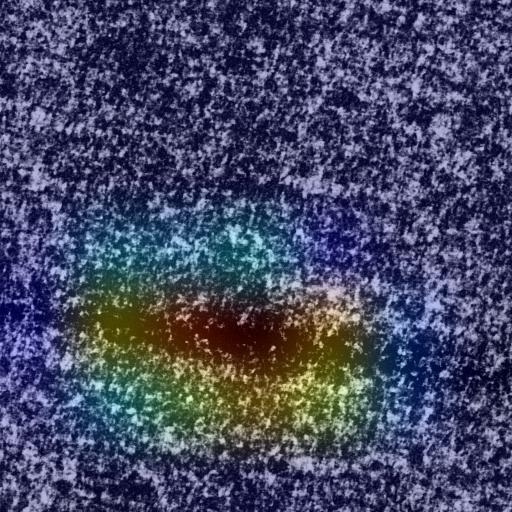

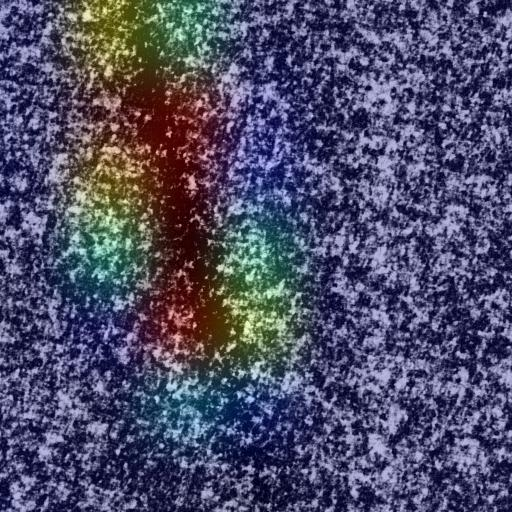

...

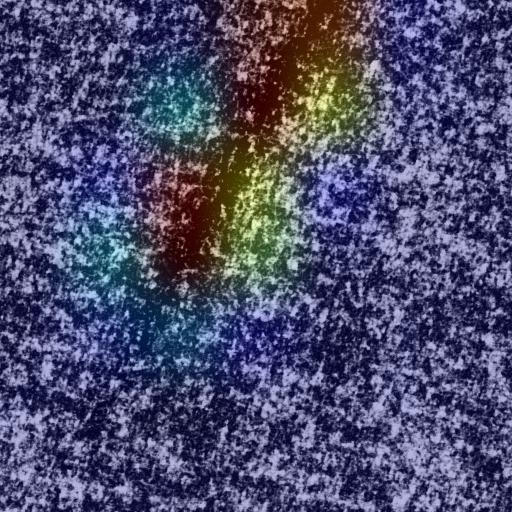

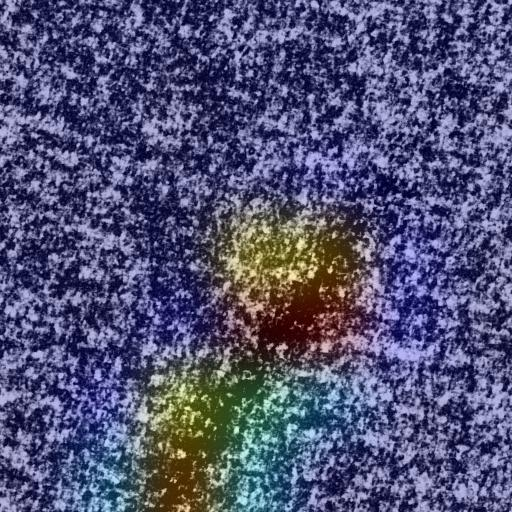

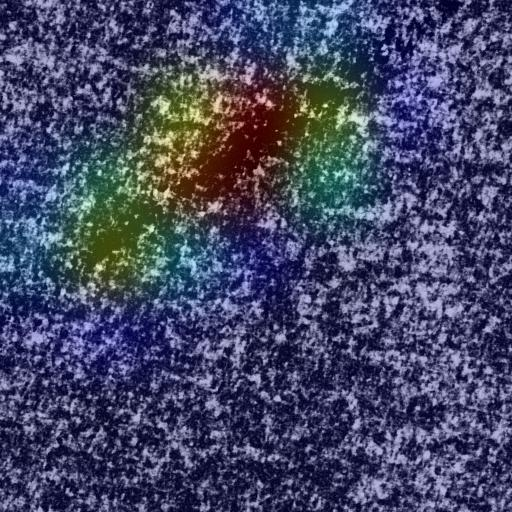

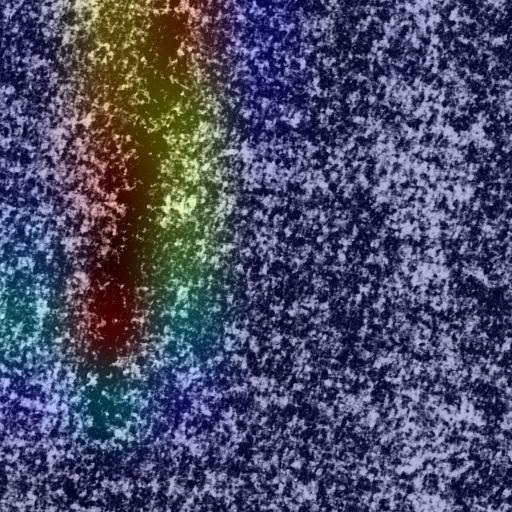

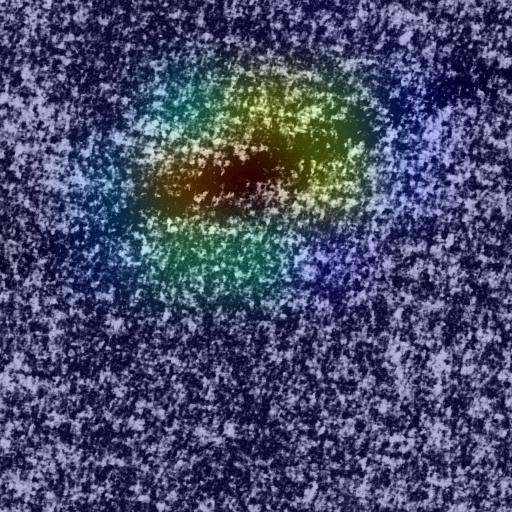

In [14]:
for i in range(df_NG.shape[0]):
    img_name = df_NG.iloc[i][1]
    img_path = os.path.join('./DAGM_KaggleUpload/Class6/Train/',img_name)
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

    save_and_display_gradcam(img_path, heatmap)

## 測試集結果

In [15]:
df = pd.read_table('./DAGM_KaggleUpload/Class6/Test/Label/Labels.txt',sep='\t',header=0, names=['NG','img_name','0','NG_label','NaN'])
df = df[['NG', 'img_name']]
df_NG = df[df['NG'] == 1]

In [16]:
df_NG

,NG,img_name
21,1,0021.PNG
27,1,0027.PNG
28,1,0028.PNG
36,1,0036.PNG
53,1,0053.PNG
...,...,...
537,1,0537.PNG
540,1,0540.PNG
546,1,0546.PNG
551,1,0551.PNG


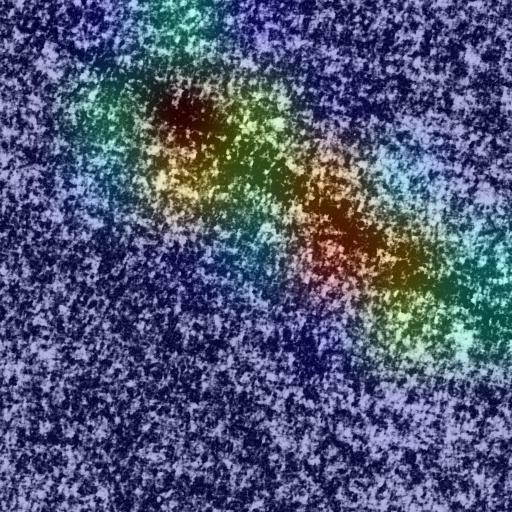

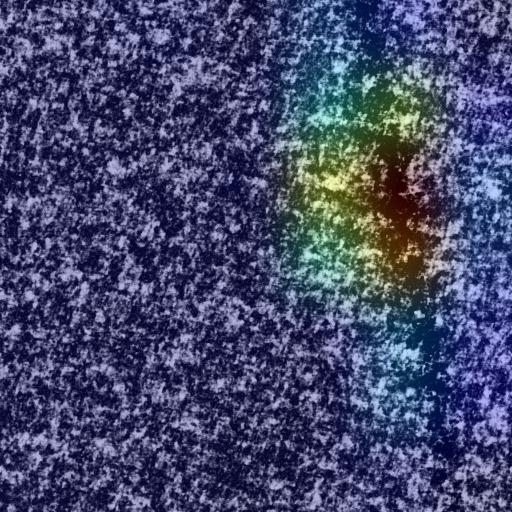

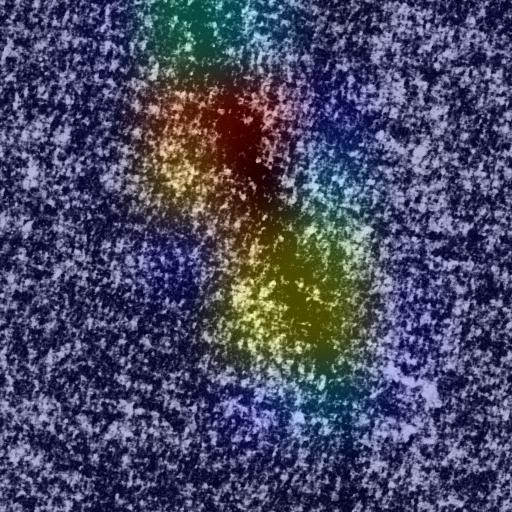

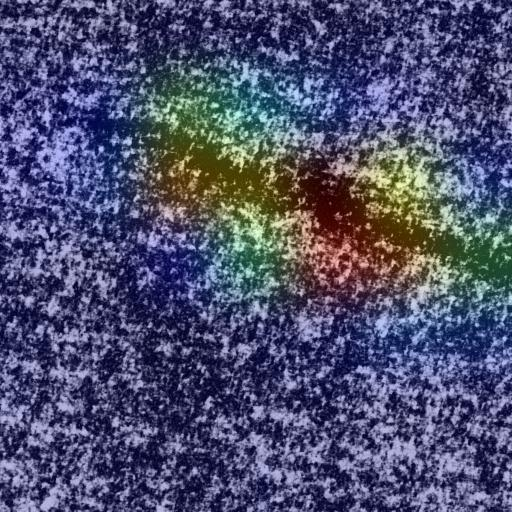

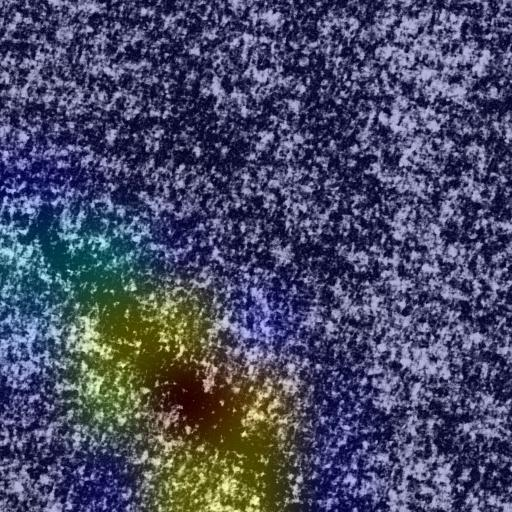

...

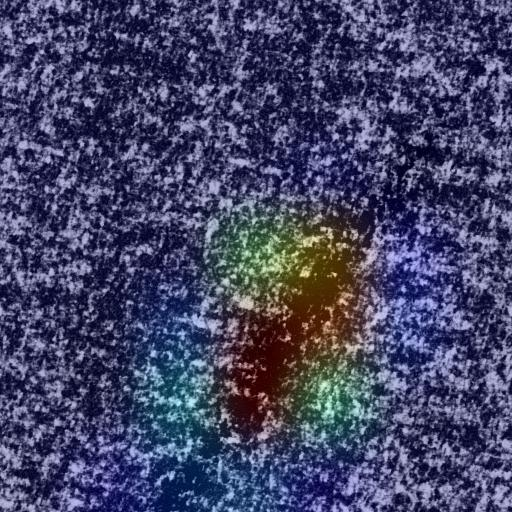

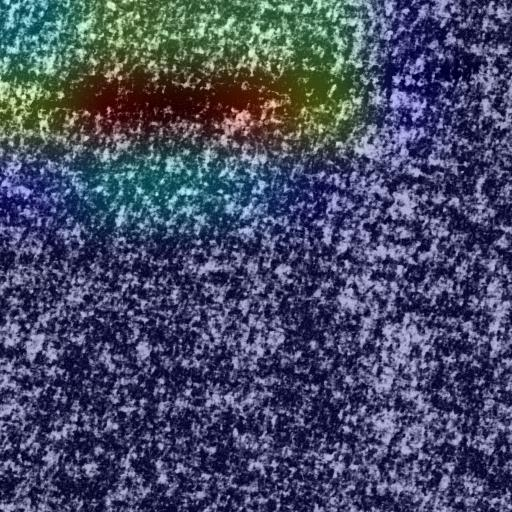

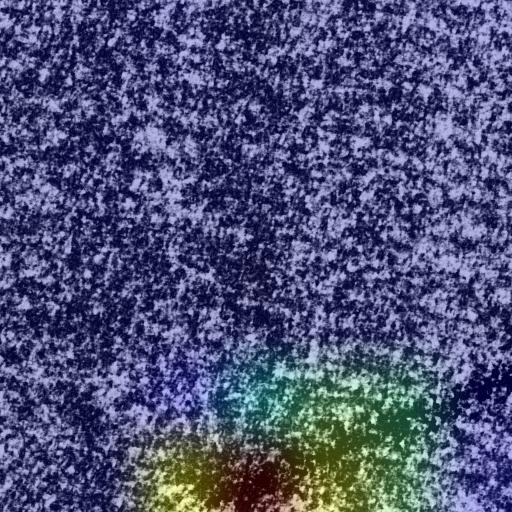

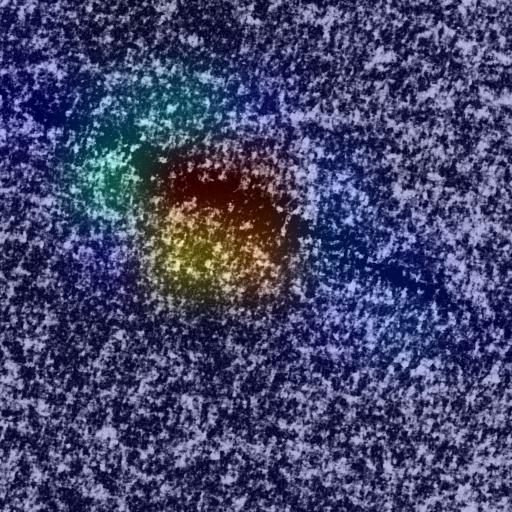

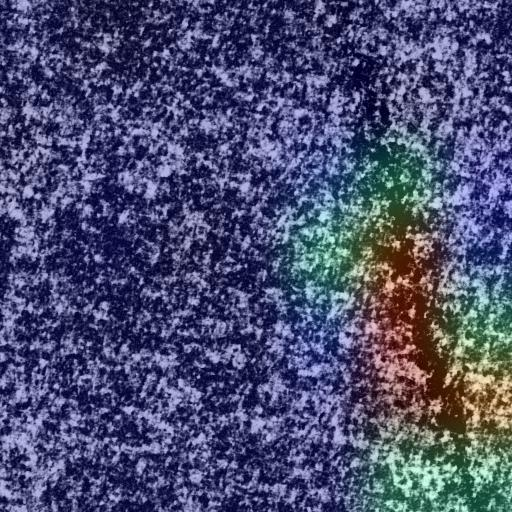

In [17]:
for i in range(df_NG.shape[0]):
    img_name = df_NG.iloc[i][1]
    img_path = os.path.join('./DAGM_KaggleUpload/Class6/Test',img_name)
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

    save_and_display_gradcam(img_path, heatmap)